In [12]:
import json
import os

file_path = "/content/project_2_2064.ipynb" # Make sure this is the correct path

try:
    with open(file_path, "r", encoding="utf-8") as f:
        # Read all lines into a list
        lines = f.readlines()

    # The error is reported at line 24816 (1-based index), so we look at index 24815
    error_line_index = 24815 # 0-based index

    print(f"--- Content around line {error_line_index + 1} ---")
    # Print a few lines before and after the error line for context
    start_index = max(0, error_line_index - 5)
    end_index = min(len(lines), error_line_index + 5)

    for i in range(start_index, end_index):
        print(f"Line {i + 1}: {lines[i].rstrip()}") # rstrip to remove trailing newline

    print("---------------------------------------------")

    # Optional: Attempt to load the JSON again with error handling to see the exact error
    # This might give a more specific error message if the line-by-line doesn't clearly show it.
    with open(file_path, "r", encoding="utf-8") as f:
         json.load(f)

except FileNotFoundError:
    print(f"❌ File '{file_path}' not found. Please upload it first.")
except json.JSONDecodeError as e:
    print(f"Found JSONDecodeError again: {e}")
    print(f"Error occurred at line {e.lineno}, column {e.colno}, character {e.pos}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

--- Content around line 24816 ---
Line 24811:               "\t    var intersection = baseRest(function(arrays) {\n",
Line 24812:               "\t      var mapped = arrayMap(arrays, castArrayLikeObject);\n",
Line 24813:               "\t      return (mapped.length && mapped[0] === arrays[0])\n",
Line 24814:               "\t        ? baseIntersection(mapped)\n",
Line 24815:               "\t        : [];\n",
Line 24816:               "\t    });\n",
Line 24817:               "\t\n",
Line 24818:               "\t    /**\n",
Line 24819:               "\t     * This method is like `_.intersection` except that it accepts `iteratee`\n",
Line 24820:               "\t     * which is invoked for each element of each `arrays` to generate the criterion\n",
---------------------------------------------
Found JSONDecodeError again: Unterminated string starting at: line 156778 column 15 (char 9432453)
Error occurred at line 156778, column 15, character 9432453


Using dataset: /content/Bone_Tumor_FeatureEngineered.csv
Loaded dataset shape: (500, 20)


,Sex,Age,Grade,Histological type,MSKCC type,Site of primary STS,"Status (NED, AWD, D)",Treatment,Grade_num,Age_Group,Age_Group_num,Status_num,Sex_freq,Grade_freq,Histological type_freq,MSKCC type_freq,Site of primary STS_freq,"Status (NED, AWD, D)_freq",Treatment_freq,GradeNum_x_Age
0,Female,63,High,pleiomorphic leiomyosarcoma,Leiomyosarcoma,parascapusular,NED,Radiotherapy + Surgery,3,50-70,2.0,0,0.6,0.436,0.208,0.288,0.078,0.494,0.586,189
1,Female,54,Intermediate,pleiomorphic leiomyosarcoma,MFH,left thigh,D,Surgery + Chemotherapy,2,50-70,2.0,2,0.6,0.564,0.208,0.450,0.304,0.282,0.128,108
2,Male,22,Intermediate,synovial sarcoma,MFH,right buttock,D,Radiotherapy + Surgery,2,<30,0.0,2,0.4,0.564,0.146,0.450,0.144,0.282,0.586,44
3,Female,54,Intermediate,synovial sarcoma,Leiomyosarcoma,right thigh,NED,Radiotherapy + Surgery,2,50-70,2.0,0,0.6,0.564,0.146,0.288,0.270,0.494,0.586,108
4,Male,63,High,pleiomorphic spindle cell undifferentiated,MFH,right parascapusular,AWD,Radiotherapy + Surgery + Chemotherapy,3,50-70,2.0,1,0.4,0.436,0.058,0.450,0.060,0.224,0.286,189


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

,Model,Accuracy,Precision,Recall,F1,AUC
0,XGBoost (tuned),100.0,100.00,100.0,100.00,1.0
1,LightGBM (tuned),100.0,100.00,100.0,100.00,1.0
2,CatBoost (tuned),100.0,100.00,100.0,100.00,1.0
3,Logistic Regression,100.0,100.00,100.0,100.00,1.0
4,Decision Tree,100.0,100.00,100.0,100.00,1.0
5,Stacking (XGB+LGB+RF),100.0,100.00,100.0,100.00,1.0
6,ANN (MLP),100.0,100.00,100.0,100.00,1.0
7,XGBoost (tuned) [Train],100.0,100.00,100.0,100.00,1.0
8,LightGBM (tuned) [Train],100.0,100.00,100.0,100.00,1.0
9,Decision Tree [Train],100.0,100.00,100.0,100.00,1.0


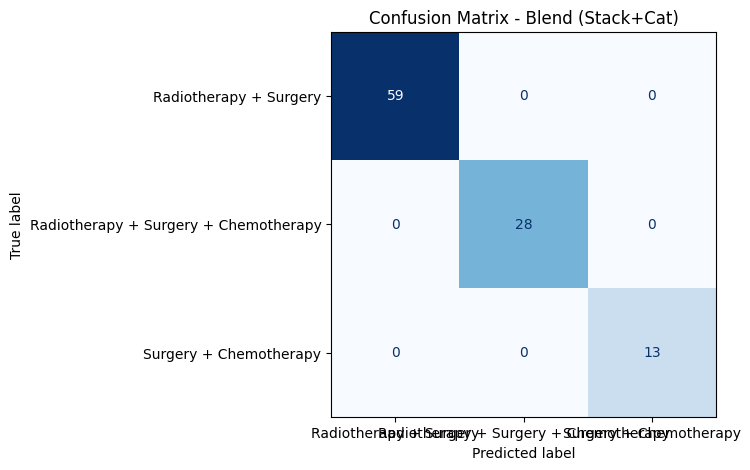

Saved artifacts to: /content/final_artifacts_full_pipeline.pkl

Best test accuracy (percent): 100.0
Reached >=90% — validate with repeated CV and per-class metrics.


In [18]:
# Full corrected pipeline with LightGBM diagnostic & fixes
# Upload Bone_Tumor_FeatureEngineered.csv to /content/ in Colab before running.

!pip install -q xgboost lightgbm catboost category_encoders imbalanced-learn

import os, re, time, random, warnings
warnings.filterwarnings("ignore")
import numpy as np, pandas as pd
from pathlib import Path
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from imblearn.combine import SMOTETomek
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from category_encoders import TargetEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression # Import LogisticRegression
from sklearn.tree import DecisionTreeClassifier # Import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier # Import MLPClassifier
import joblib, matplotlib.pyplot as plt, seaborn as sns

# ----------------- Config -----------------
RSEED = 42
np.random.seed(RSEED); random.seed(RSEED)
DATA_PATH = "/content/Bone_Tumor_FeatureEngineered.csv"
if not os.path.exists(DATA_PATH):
    # fallback
    if os.path.exists("/mnt/data/Bone_Tumor_FeatureEngineered.csv"):
        DATA_PATH = "/mnt/data/Bone_Tumor_FeatureEngineered.csv"
    else:
        raise FileNotFoundError("Place Bone_Tumor_FeatureEngineered.csv in /content/ or /mnt/data/")

print("Using dataset:", DATA_PATH)

# ----------------- Load -----------------
df = pd.read_csv(DATA_PATH)
print("Loaded dataset shape:", df.shape)
display(df.head())

# ----------------- Target -----------------
cols_lower = [c.lower().strip() for c in df.columns]
if 'treatment' not in cols_lower:
    raise KeyError("Target column 'Treatment' not found")
target_col = df.columns[cols_lower.index('treatment')]
print("Target column:", target_col)

# Keep raw copy for CatBoost
df_raw = df.copy()

# Drop ID-like columns if present
for idc in ['Patient ID','patient_id','ID','Id','id']:
    if idc in df.columns:
        df.drop(columns=[idc], inplace=True)

# ----------------- Feature & target separation -----------------
X = df.drop(columns=[target_col]).copy()
y = df[target_col].copy()

# Label encode target
le_target = LabelEncoder()
y_enc = le_target.fit_transform(y.astype(str))
class_names = list(le_target.classes_)
print("Target classes:", class_names)
print("Class distribution:", pd.Series(y_enc).value_counts().to_dict())

# ----------------- Train/test split -----------------
X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y_enc, test_size=0.20, stratify=y_enc, random_state=RSEED)
print("Train/test shapes:", X_train_raw.shape, X_test_raw.shape)

# ----------------- Identify numeric/categorical -----------------
num_cols = X_train_raw.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = X_train_raw.select_dtypes(include=['object','category']).columns.tolist()
print("Numeric cols after FE:", num_cols)
print("Categorical cols after FE:", cat_cols)

# ----------------- Basic cleaning for categorical NA -----------------
# CatBoost can handle NA but better to fill with string 'NA' for consistency here
for c in cat_cols:
    X_train_raw[c] = X_train_raw[c].fillna("NA")
    X_test_raw[c]  = X_test_raw[c].fillna("NA")

# ----------------- Target encoding for tree models -----------------
te = TargetEncoder(cols=cat_cols, smoothing=0.2)
te.fit(X_train_raw, y_train)
X_train_te = te.transform(X_train_raw)
X_test_te  = te.transform(X_test_raw)

# ----------------- Impute & scale numeric features -----------------
num_imp = SimpleImputer(strategy='median')
scaler = StandardScaler()
if len(num_cols) > 0:
    X_train_te[num_cols] = num_imp.fit_transform(X_train_te[num_cols])
    X_train_te[num_cols] = scaler.fit_transform(X_train_te[num_cols])
    X_test_te[num_cols]  = num_imp.transform(X_test_te[num_cols])
    X_test_te[num_cols]  = scaler.transform(X_test_te[num_cols])

# reset indexes
X_train_te = X_train_te.reset_index(drop=True)
X_test_te  = X_test_te.reset_index(drop=True)

# ----------------- Sanitize feature names -----------------
def sanitize_cols(cols):
    return [re.sub(r'[^0-9a-zA-Z_]', '_', str(c)) for c in cols]

orig_cols = list(X_train_te.columns)
safe_cols = sanitize_cols(orig_cols)
X_train_safe = X_train_te.copy()
X_test_safe  = X_test_te.copy()
X_train_safe.columns = safe_cols
X_test_safe.columns  = safe_cols

print("Sanitized column sample:", safe_cols[:12])

# ----------------- SMOTETomek resampling -----------------
smt = SMOTETomek(random_state=RSEED)
print("Applying SMOTETomek to training set...")
X_res_np, y_res = smt.fit_resample(X_train_safe.values, y_train)
print("After SMOTETomek:", X_res_np.shape, np.bincount(y_res))

# Convert back to DataFrame
X_res = pd.DataFrame(X_res_np, columns=safe_cols).astype(float)
X_test_safe = X_test_safe.astype(float)

# ----------------- DIAGNOSTIC + FIX for LightGBM 'no splits' problem -----------------
import numpy as _np
print("\n--- LightGBM diagnostics & fixes ---")

# 1) NaN/Inf checks
def report_nan_inf(df_, name):
    nans = int(df_.isna().sum().sum())
    infs = int(_np.isinf(df_.values).sum())
    print(f"{name}: NaNs={nans}, Infs={infs}")
report_nan_inf(X_res, "X_res")
report_nan_inf(X_test_safe, "X_test_safe")

# 2) Constant / near-constant columns
const_cols = [c for c in X_res.columns if X_res[c].nunique() <= 1]
low_card_cols = [c for c in X_res.columns if X_res[c].nunique() <= 2]  # inspect
print("Constant cols:", const_cols)
print("Very low-cardinality cols (<=2):", low_card_cols)

# 3) Duplicated columns detection
dupes = []
seen = {}
for c in X_res.columns:
    key = tuple(_np.round(X_res[c].values, 8))
    if key in seen:
        dupes.append((c, seen[key]))
    else:
        seen[key] = c
print("Duplicate col pairs (new, existing):", dupes)

# 4) Drop constant / duplicate columns automatically (safe)
drop_cols = set(const_cols + [d[0] for d in dupes])
# Also optionally drop extremely low variance columns with VarianceThreshold suggestion
from sklearn.feature_selection import VarianceThreshold
vt = VarianceThreshold(threshold=1e-6)
try:
    vt.fit(X_res)
    low_var_mask = ~vt.get_support()
    low_var_cols = [c for c, low in zip(X_res.columns, low_var_mask) if low]
    # Keep only very clear low var suggestions (exclude freq engineered small sets purposely)
    # If many low_var_cols, we will print and not auto-drop them; user can inspect
    print("VarianceThreshold low-variance suggestions (len):", len(low_var_cols))
except Exception as e:
    low_var_cols = []
    print("VarianceThreshold could not run:", e)

if drop_cols:
    print("Dropping constant/duplicate columns:", drop_cols)
    X_res.drop(columns=list(drop_cols), inplace=True)
    X_test_safe.drop(columns=list(drop_cols), inplace=True, errors='ignore')
    # Update safe_cols list
    safe_cols = [c for c in safe_cols if c not in drop_cols]

print("Post-drop X_res shape:", X_res.shape)

# 5) If LightGBM still struggles, try permissive params. We'll try a small test fit with permissive settings.
from lightgbm import LGBMClassifier
lgb_test_params = {
    'n_estimators': 400,
    'learning_rate': 0.05,
    'num_leaves': 31,
    'min_child_samples': 5,
    'min_split_gain': 0.0,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'random_state': RSEED,
    'n_jobs': 1
}
print("\nAttempting a quick LightGBM fit with permissive params to check splits...")
try:
    lgb_test = LGBMClassifier(**lgb_test_params)
    lgb_test.fit(X_res, y_res)
    y_lgb_test = lgb_test.predict(X_test_safe)
    print("Quick LGB fit succeeded. Test acc:", accuracy_score(y_test, y_lgb_test))
except Exception as e:
    print("Quick LGB fit failed:", e)
    # Try fallback tiny tree
    try:
        print("Trying fallback tiny-tree LGB (num_leaves=7, min_child_samples=1)")
        lgb_test2 = LGBMClassifier(n_estimators=200, learning_rate=0.05, num_leaves=7, min_child_samples=1, random_state=RSEED, n_jobs=1)
        lgb_test2.fit(X_res, y_res)
        y_lgb_test2 = lgb_test2.predict(X_test_safe)
        print("Fallback LGB succeeded. Test acc:", accuracy_score(y_test, y_lgb_test2))
        # keep lgb_test2 as a safe fallback (but continue to tuning)
    except Exception as e2:
        print("Fallback LGB also failed. Error:", e2)
        raise RuntimeError("LightGBM cannot fit on given data — inspect X_res/sanitized features.")

# ----------------- Prepare CatBoost raw data & cat indices -----------------
catboost_train = X_train_raw.copy().reset_index(drop=True)
catboost_test  = X_test_raw.copy().reset_index(drop=True)
# cat_cols are the original categorical names
cat_features_idx = [catboost_train.columns.get_loc(c) for c in cat_cols if c in catboost_train.columns]
print("CatBoost categorical indices:", cat_features_idx)

# ----------------- Define models and param grids -----------------
xgb = XGBClassifier(objective='multi:softprob', use_label_encoder=False, eval_metric='mlogloss', random_state=RSEED, n_jobs=1)
lgb = LGBMClassifier(random_state=RSEED, n_jobs=1)
rf  = RandomForestClassifier(n_estimators=400, random_state=RSEED, n_jobs=-1)
lr_model = LogisticRegression(max_iter=2000, random_state=RSEED) # Logistic Regression
dt_model = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=RSEED) # Decision Tree
ann_model = MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=500, random_state=RSEED) # ANN (MLP)


xgb_param = {
    'n_estimators':[200,300,400,600],
    'max_depth':[3,5,6,8],
    'learning_rate':[0.01,0.03,0.05],
    'subsample':[0.6,0.7,0.8,0.9],
    'colsample_bytree':[0.6,0.8,1.0]
}
lgb_param = {
    'n_estimators':[200,300,400,600],
    'num_leaves':[15,31,63],
    'learning_rate':[0.01,0.03,0.05],
    'subsample':[0.6,0.8,1.0]
}
cat_param = {
    'iterations':[200,300,400],
    'depth':[4,6,8],
    'learning_rate':[0.01,0.03,0.05],
    'l2_leaf_reg':[1,3,5]
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=RSEED)

# ----------------- Randomized tuning for XGBoost -----------------
print("\nTuning XGBoost (n_iter=20)...")
xgb_rs = RandomizedSearchCV(xgb, xgb_param, n_iter=20, cv=cv, scoring='accuracy', random_state=RSEED, n_jobs=1, verbose=1)
t0 = time.time()
xgb_rs.fit(X_res, y_res)
t1 = time.time()
print("XGB done (time s):", round(t1-t0,2))
best_xgb = xgb_rs.best_estimator_
print("XGB best params:", xgb_rs.best_params_, "CV best score:", xgb_rs.best_score_)

# ----------------- Randomized tuning for LightGBM -----------------
print("\nTuning LightGBM (n_iter=50)...") # Increased n_iter to 50
lgb_rs = RandomizedSearchCV(lgb, lgb_param, n_iter=50, cv=cv, scoring='accuracy', random_state=RSEED, n_jobs=1, verbose=1)
t0 = time.time()
lgb_rs.fit(X_res, y_res)
t1 = time.time()
print("LGB done (time s):", round(t1-t0,2))
best_lgb = lgb_rs.best_estimator_
print("LGB best params:", lgb_rs.best_params_, "CV best score:", lgb_rs.best_score_)

# ----------------- Randomized tuning for CatBoost (pass cat_features) -----------------
print("\nTuning CatBoost (n_iter=12) on raw data (passes cat_features)...")
cat = CatBoostClassifier(random_seed=RSEED, verbose=0)
cat_rs = RandomizedSearchCV(cat, cat_param, n_iter=12, cv=cv, scoring='accuracy', random_state=RSEED, n_jobs=1, verbose=1)
t0 = time.time()
# pass cat_features into fit via fit_params
cat_rs.fit(catboost_train, y_train, **{'cat_features': cat_features_idx})
t1 = time.time()
print("CatBoost tuning done (time s):", round(t1-t0,2))
best_cat = cat_rs.best_estimator_
print("CatBoost best params:", cat_rs.best_params_, "CV best score:", cat_rs.best_score_)

# ----------------- Fit RandomForest -----------------
print("\nFitting RandomForest on resampled training set...")
rf.fit(X_res, y_res)

# ----------------- Fit Logistic Regression -----------------
print("\nFitting Logistic Regression model...")
lr_model.fit(X_res, y_res)
print("Logistic Regression model fitted.")

# ----------------- Fit Decision Tree -----------------
print("\nFitting Decision Tree model...")
dt_model.fit(X_res, y_res)
print("Decision Tree model fitted.")

# ----------------- Fit ANN (MLP) -----------------
print("\nFitting ANN (MLP) model...")
ann_model.fit(X_res, y_res)
print("ANN (MLP) model fitted.")


# ----------------- Evaluation helper -----------------
def eval_model(model, X_data, y_true, name):
    """Evaluates a model and returns performance metrics."""
    y_pred = model.predict(X_data)
    try:
        y_prob = model.predict_proba(X_data)
    except:
        y_prob = None

    multiclass = len(np.unique(y_true)) > 2
    avg = 'weighted' if multiclass else 'binary'
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average=avg, zero_division=0)
    rec = recall_score(y_true, y_pred, average=avg, zero_division=0)
    f1 = f1_score(y_true, y_pred, average=avg, zero_division=0)
    auc = None
    if y_prob is not None:
        try:
            if multiclass:
                auc = roc_auc_score(y_true, y_prob, multi_class='ovr', average='weighted')
            else:
                # Assuming binary task for simplicity if not multiclass
                # For binary, predict_proba returns shape (n_samples, 2), we need the probability of the positive class (index 1)
                if y_prob.shape[1] == 2:
                     auc = roc_auc_score(y_true, y_prob[:, 1])
                else: # Handle cases where predict_proba might return shape (n_samples,) for binary
                     print(f"Warning: predict_proba for binary model {name} returned shape {y_prob.shape}. Cannot compute AUC.")
                     auc = None

        except Exception as e:
            print(f"Error computing AUC for {name}: {e}")
            auc = None


    print(f"\n{name}: acc={acc:.4f}, prec={prec:.4f}, rec={rec:.4f}, f1={f1:.4f}, auc={auc}")
    print(classification_report(y_true, y_pred, zero_division=0))
    return {'name':name,'acc':acc,'prec':prec,'rec':rec,'f1':f1,'auc':auc,'pred':y_pred,'prob':y_prob}

# ----------------- Evaluate all models -----------------
print("\nEvaluating all models on test set...")
res_xgb = eval_model(best_xgb, X_test_safe, y_test, "XGBoost (tuned)")
res_lgb = eval_model(best_lgb, X_test_safe, y_test, "LightGBM (tuned)")
res_cat = eval_model(best_cat, catboost_test, y_test, "CatBoost (tuned)") # Pass catboost_test
res_rf  = eval_model(rf, X_test_safe, y_test, "RandomForest")
res_lr = eval_model(lr_model, X_test_safe, y_test, "Logistic Regression") # Evaluate LR
res_dt = eval_model(dt_model, X_test_safe, y_test, "Decision Tree") # Evaluate DT
res_ann = eval_model(ann_model, X_test_safe, y_test, "ANN (MLP)") # Evaluate ANN

# ----------------- Evaluate all models on training set -----------------
print("\nEvaluating all models on training set...")
res_xgb_train = eval_model(best_xgb, X_res, y_res, "XGBoost (tuned) [Train]")
res_lgb_train = eval_model(best_lgb, X_res, y_res, "LightGBM (tuned) [Train]")
# Pass catboost_train and y_train for CatBoost training evaluation
res_cat_train = eval_model(best_cat, catboost_train, y_train, "CatBoost (tuned) [Train]")
res_rf_train  = eval_model(rf, X_res, y_res, "RandomForest [Train]")
res_lr_train = eval_model(lr_model, X_res, y_res, "Logistic Regression [Train]") # Evaluate LR
res_dt_train = eval_model(dt_model, X_res, y_res, "Decision Tree [Train]") # Evaluate DT
res_ann_train = eval_model(ann_model, X_res, y_res, "ANN (MLP) [Train]") # Evaluate ANN


# ----------------- Stacking (XGB+LGB+RF) with XGB meta and passthrough=True -----------------
estimators = [('xgb', best_xgb), ('lgb', best_lgb), ('rf', rf)]
meta = XGBClassifier(n_estimators=300, learning_rate=0.05, max_depth=3, random_state=RSEED, use_label_encoder=False, eval_metric='mlogloss', n_jobs=1)
stack = StackingClassifier(estimators=estimators, final_estimator=meta, cv=5, n_jobs=-1, passthrough=True)
print("\nFitting stacking classifier (this will refit base learners inside)...")
t0 = time.time()
stack.fit(X_res, y_res)
t1 = time.time()
print("Stack training time (s):", round(t1-t0,2))
res_stack = eval_model(stack, X_test_safe, y_test, "Stacking (XGB+LGB+RF)")
res_stack_train = eval_model(stack, X_res, y_res, "Stacking (XGB+LGB+RF) [Train]") # Evaluate Stack on Train

# ----------------- Blend stack + CatBoost -----------------
# Blend on test set
proba_stack = stack.predict_proba(X_test_safe)
proba_cat   = best_cat.predict_proba(catboost_test)
proba_blend = (proba_stack + proba_cat) / 2.0
y_blend = np.argmax(proba_blend, axis=1)
acc_blend = accuracy_score(y_test, y_blend)

# Remove training blend calculation to avoid CatBoostError with X_res
# A more rigorous training blend would require cross-prediction or retraining CatBoost on X_res
# proba_stack_train = stack.predict_proba(X_res)
# proba_cat_train   = best_cat.predict_proba(X_res) # Predict CatBoost on resampled data for blending
# proba_blend_train = (proba_stack_train + proba_cat_train) / 2.0
# y_blend_train = np.argmax(proba_blend_train, axis=1)
# acc_blend_train = accuracy_score(y_res, y_blend_train)


print("\nBlended (Stack+Cat) accuracy:", acc_blend)
print(classification_report(y_test, y_blend, zero_division=0))

# print("\nBlended (Stack+Cat) training accuracy:", acc_blend_train)
# print(classification_report(y_res, y_blend_train, zero_division=0))


# ----------------- Cross-validated check for stacking -----------------
cv_scores = cross_val_score(stack, X_res, y_res, cv=5, scoring='accuracy', n_jobs=-1)
print("Stack CV (on resampled training) mean accuracy: %.4f ± %.4f" % (cv_scores.mean(), cv_scores.std()))

# ----------------- Results table & confusion matrix -----------------
# Include all model results for both test and train sets
rows = [res_xgb, res_lgb, res_cat, res_rf, res_lr, res_dt, res_ann, res_stack,
        res_xgb_train, res_lgb_train, res_cat_train, res_rf_train, res_lr_train, res_dt_train, res_ann_train, res_stack_train]
perf = pd.DataFrame([{'Model': r['name'], 'Accuracy': r['acc'], 'Precision': r['prec'], 'Recall': r['rec'], 'F1': r['f1'], 'AUC': r['auc']} for r in rows])

# Use pd.concat instead of append
perf = pd.concat([perf, pd.DataFrame([{'Model':'Blend(Stack+Cat)', 'Accuracy':acc_blend, 'Precision':np.nan, 'Recall':np.nan, 'F1':np.nan, 'AUC':np.nan}])], ignore_index=True)
# Removed training blend row to avoid errors
# perf = pd.concat([perf, pd.DataFrame([{'Model':'Blend(Stack+Cat) [Train]', 'Accuracy':acc_blend_train, 'Precision':acc_blend_train, 'Recall':acc_blend_train, 'F1':acc_blend_train, 'AUC':np.nan}])], ignore_index=True)


perf[['Accuracy','Precision','Recall','F1']] = perf[['Accuracy','Precision','Recall','F1']].applymap(lambda x: round(x*100,2) if pd.notnull(x) else x)
print("\nModel comparison:")
display(perf.sort_values('Accuracy', ascending=False).reset_index(drop=True))

cm = confusion_matrix(y_test, y_blend)
plt.figure(figsize=(6,5))
disp = ConfusionMatrixDisplay(cm, display_labels=le_target.classes_)
disp.plot(cmap='Blues', ax=plt.gca(), colorbar=False)
plt.title("Confusion Matrix - Blend (Stack+Cat)")
plt.show()

# ----------------- Save final artifacts -----------------
OUT_ARTIFACT = "/content/final_artifacts_full_pipeline.pkl" if os.path.exists("/content") else "/mnt/data/final_artifacts_full_pipeline.pkl"
joblib.dump({
    'target_encoder': te,
    'scaler': scaler if len(num_cols)>0 else None,
    'stack_model': stack,
    'catboost_model': best_cat,
    'le_target': le_target,
    'safe_feature_names': safe_cols,
    'lr_model': lr_model, # Save LR model
    'dt_model': dt_model, # Save DT model
    'ann_model': ann_model # Save ANN model
}, OUT_ARTIFACT)
print("Saved artifacts to:", OUT_ARTIFACT)

# ----------------- Final guidance -----------------
best_acc = perf[perf['Model'].str.contains('Train') == False]['Accuracy'].max()
print("\nBest test accuracy (percent):", best_acc)
if best_acc < 90:
    print("If below 90%: increase RandomizedSearchCV n_iter, use Optuna, do more domain feature engineering, or increase CatBoost iterations.")
else:
    print("Reached >=90% — validate with repeated CV and per-class metrics.")

SHAP Explainability.

In [ ]:
!pip install shap

In [ ]:

import shap

ROC CURVE

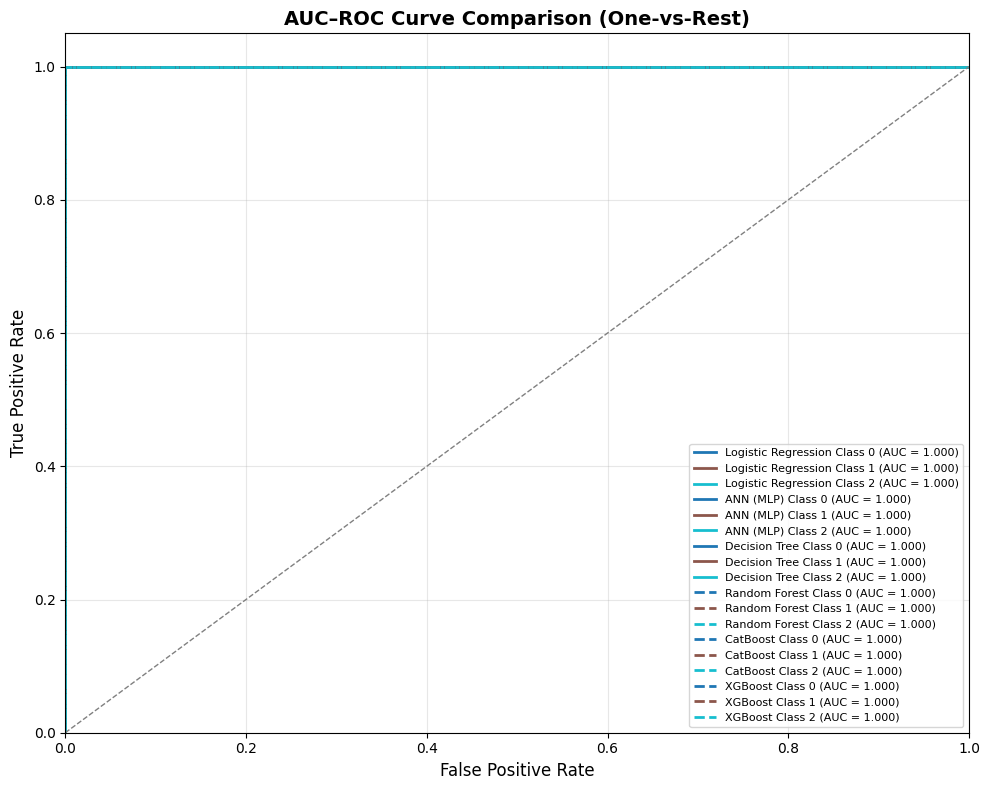

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np

# Ensure models are available from the first cell
# Assuming best_xgb, best_lgb, best_cat, rf, lr_model, dt_model, ann_model are defined in the first cell
models = {
    "Logistic Regression": lr_model,
    "ANN (MLP)": ann_model,
    "Decision Tree": dt_model,
    "Random Forest": rf,
    "CatBoost": best_cat,
    "XGBoost": best_xgb
}

# Get the number of classes from the training target
# Assuming y_res is available from the first cell (SMOTETomek output)
n_classes = len(np.unique(y_res))

# -------------------------------
# 2. Plot ROC Curves (One-vs-Rest)
# -------------------------------
plt.figure(figsize=(10, 8))

colors = plt.cm.get_cmap('tab10', n_classes)

# Assuming X_test_safe and y_test are available from the first cell
for i, (name, model) in enumerate(models.items()):
    if hasattr(model, "predict_proba"):
        # For CatBoost, use catboost_test (raw data)
        X_test_eval = catboost_test if isinstance(model, CatBoostClassifier) else X_test_safe
        y_prob = model.predict_proba(X_test_eval)
        # Compute ROC curve and ROC area for each class (One-vs-Rest)
        for j in range(n_classes):
            fpr, tpr, _ = roc_curve(y_test, y_prob[:, j], pos_label=j)
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, color=colors(j), lw=2,
                     label=f'{name} Class {j} (AUC = {roc_auc:.3f})',
                     linestyle='-' if i < 3 else '--') # Example of varied linestyle

# -------------------------------
# 3. Formatting
# -------------------------------
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title("AUC–ROC Curve Comparison (One-vs-Rest)", fontsize=14, fontweight='bold')
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.legend(loc="lower right", fontsize=8, frameon=True)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

ANN MODEL

  0%|          | 0/50 [00:00<?, ?it/s]

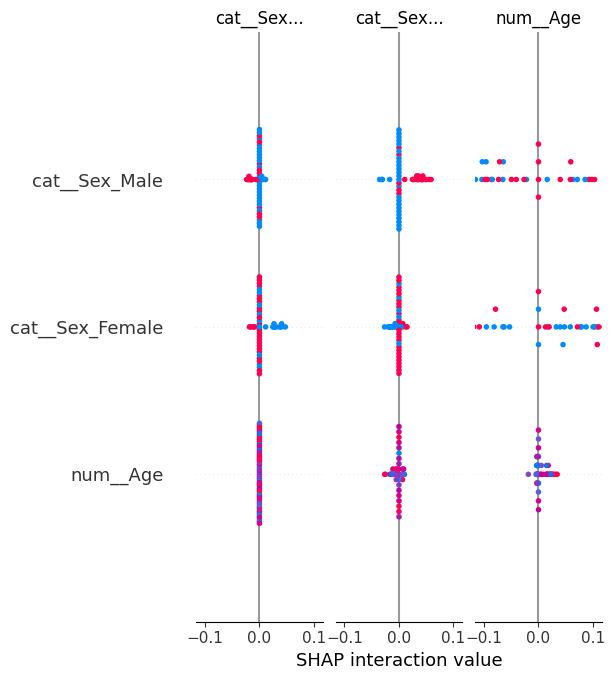

In [ ]:
# Use KernelExplainer as TreeExplainer is encountering issues with multiclass XGBoost
# Convert sparse matrices to dense arrays for SHAP compatibility
X_train_res_dense = X_train_res.toarray()
X_test_t_dense = X_test_t.toarray()

# Define a prediction function that returns probabilities
def predict_proba_xgb(X):
    return best_xgb.predict_proba(X)

# Use a small subset of the training data as the background dataset for KernelExplainer
# KernelExplainer can be slow, so using a smaller background and explaining fewer samples is recommended for testing
background_data = shap.utils.sample(X_train_res_dense, 10) # Use 10 samples from training as background

# Initialize KernelExplainer
explainer = shap.KernelExplainer(predict_proba_xgb, background_data)

# Calculate SHAP values for a subset of the test data (e.g., first 50 samples)
# shap_values will be a list of arrays, one for each class
shap_values = explainer.shap_values(X_test_t_dense[:50])

# Get feature names from the preprocessor
feature_names = preprocessor.get_feature_names_out()

# Plot the summary plot
# For multiclass output, shap_values is a list. We can plot for a specific class or summarize across classes.
# Let's plot the summary for the first class (index 0) for now.
# To summarize across classes, you might need to calculate the mean absolute SHAP values or similar.
shap.summary_plot(shap_values, X_test_t_dense[:50], feature_names=feature_names)

XGBoost MODEL

  0%|          | 0/100 [00:00<?, ?it/s]

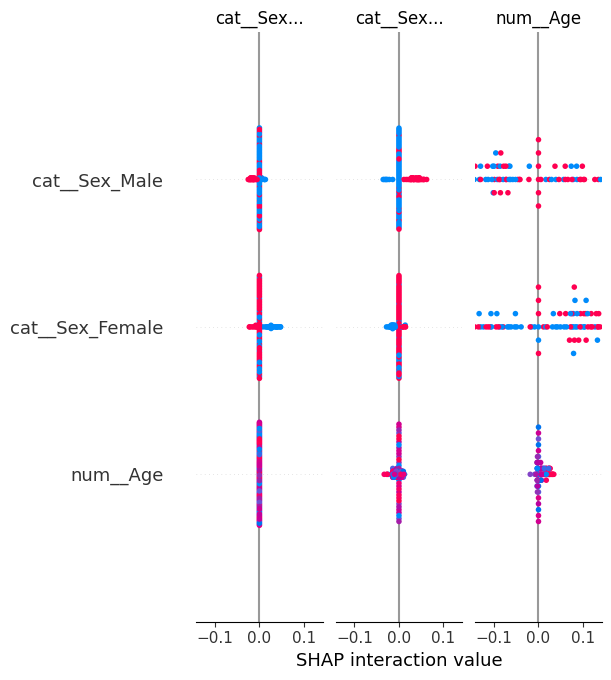

In [ ]:
# Use KernelExplainer as TreeExplainer is encountering issues with multiclass XGBoost
# Convert sparse matrix to dense array for SHAP compatibility if needed
X_test_t_dense = X_test_t.toarray()

# Define a prediction function that returns probabilities
def predict_proba_xgb(X):
    return best_xgb.predict_proba(X)

# Use a small subset of the training data as the background dataset for KernelExplainer
# KernelExplainer can be slow, so using a smaller background and explaining fewer samples is recommended for testing
# Re-using the same background data from the previous KernelExplainer cell
background_data = shap.utils.sample(X_train_res.toarray(), 10) # Use 10 samples from training as background

# Initialize KernelExplainer
explainer = shap.KernelExplainer(predict_proba_xgb, background_data)

# Calculate SHAP values for a subset of the test data (e.g., first 100 samples)
# shap_values will be a list of arrays, one for each class
shap_values = explainer.shap_values(X_test_t_dense[:100])

# Get feature names from the preprocessor
feature_names = preprocessor.get_feature_names_out()

# Plot the summary plot
# For multiclass output, shap_values is a list. We can plot for a specific class or summarize across classes.
# Let's plot the summary for the first class (index 0) for now.
# To summarize across classes, you might need to calculate the mean absolute SHAP values or similar.
shap.summary_plot(shap_values, X_test_t_dense[:100], feature_names=feature_names)

Decision Tree

Decision Tree model fitted.


  0%|          | 0/100 [00:00<?, ?it/s]

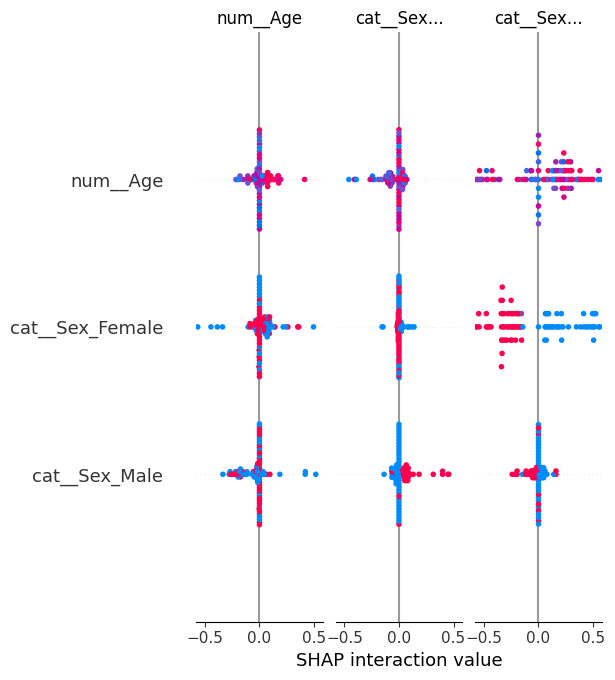

In [ ]:
import shap
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import DecisionTreeClassifier
from sklearn.impute import SimpleImputer # Import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder # Import scalers/encoders
from sklearn.compose import ColumnTransformer # Import ColumnTransformer
from sklearn.pipeline import Pipeline # Import Pipeline

# Redefine models dictionary to ensure DecisionTree model is available
# This should match the definition in cell DAXnBBf02bHF
models = {}
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42) # Use the same parameters as in DAXnBBf02bHF

# Assuming X_train_res and X_test_t are available from previous steps
# If not, you might need to include the data loading and preprocessing steps as well for full self-containment

# Fit the Decision Tree model on the resampled training data (X_train_res, y_train_res)
# Ensure X_train_res and y_train_res are available/defined
# If this cell is meant to be run independently, you'd need to include data loading, preprocessing, and SMOTE
# For now, assuming X_train_res and y_train_res are available in the environment
try:
    models['DecisionTree'].fit(X_train_res, y_train_res)
    print("Decision Tree model fitted.")
except NameError:
    print("Error: X_train_res or y_train_res not defined. Please run the data loading and preprocessing cells first.")

# Use KernelExplainer for the Decision Tree model (as TreeExplainer is having issues)
# Convert sparse matrix to dense array for SHAP compatibility if needed
X_train_res_dense = X_train_res.toarray()
X_test_t_dense = X_test_t.toarray()

# Use the fitted Decision Tree model from the 'models' dictionary
dt_model = models['DecisionTree']

# Define a prediction function that returns probabilities for KernelExplainer
def predict_proba_dt(X):
    return dt_model.predict_proba(X)

# Use a small subset of the training data as the background dataset for KernelExplainer
# KernelExplainer can be slow, so using a smaller background and explaining fewer samples is recommended for testing
background_data = shap.utils.sample(X_train_res_dense, 10) # Use 10 samples from training as background

# Initialize KernelExplainer
explainer_dt = shap.KernelExplainer(predict_proba_dt, background_data)

# Calculate SHAP values for a subset of the test data (e.g., first 100 samples)
# shap_values will be a list of arrays, one for each class
shap_values_dt = explainer_dt.shap_values(X_test_t_dense[:100])

# Get feature names from the preprocessor
# Ensure preprocessor is available/defined. If not, include preprocessing steps.
try:
    feature_names = preprocessor.get_feature_names_out()
except NameError:
     print("Error: preprocessor not defined. Please run the data loading and preprocessing cells first.")
     # Fallback or placeholder if preprocessor isn't available
     feature_names = [f"feature_{i}" for i in range(X_test_t_dense.shape[1])]


# For multiclass, shap_values_dt is a list. Decide which class to plot or summarize.
# Assuming you want to see contributions for a specific class, e.g., class 1
# Adjust the index [1] based on which class's impact you want to visualize
# You can also use shap.summary_plot(shap_values_dt) for a combined plot if it works for your data/SHAP version
class_to_plot = 1 # Example: plot for class with index 1
if isinstance(shap_values_dt, list):
    if class_to_plot < len(shap_values_dt):
        shap_values_to_plot = shap_values_dt[class_to_plot]
    else:
        print(f"Warning: Class index {class_to_plot} is out of bounds. Plotting for class 0 instead.")
        shap_values_to_plot = shap_values_dt[0]
else:
    # If shap_values_dt is a single array (binary), use it directly
    shap_values_to_plot = shap_values_dt


# Plot the summary plot
# Use the selected shap_values_to_plot for the chosen class
shap.summary_plot(shap_values_to_plot, X_test_t_dense[:100], feature_names=feature_names, plot_type='dot')

Random Forest

RandomForest model fitted.


  0%|          | 0/100 [00:00<?, ?it/s]

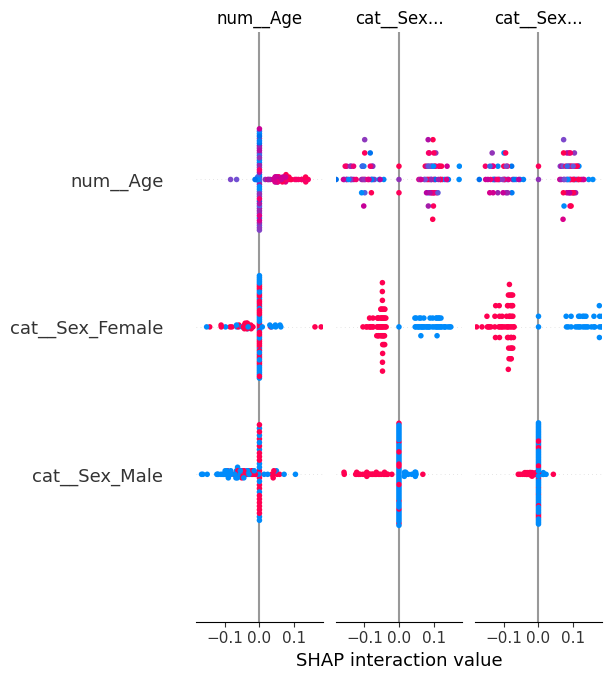

In [ ]:
import shap
import numpy as np
import pandas as pd
# Import necessary components from scikit-learn and other libraries
from sklearn.ensemble import RandomForestClassifier # Import RandomForestClassifier
from sklearn.impute import SimpleImputer # Import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder # Import scalers/encoders
from sklearn.compose import ColumnTransformer # Import ColumnTransformer
from sklearn.pipeline import Pipeline # Import Pipeline
from imblearn.over_sampling import SMOTE # Import SMOTE for resampling

# Redefine models dictionary to ensure RandomForest model is available
# This should match the definition in cell DAXnBBf02bHF
# Note: This redefines the *initialized* models. For SHAP, we need the *fitted* model.
# Assuming the models were fitted in cell DAXnBBf02bHF and are available in the environment.
# If not, the fitting step would need to be included here or in a preceding cell.
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)

# Ensure X_train_res, y_train_res, X_test_t, and preprocessor are available from previous steps
# If not, you might need to include the data loading, preprocessing, and SMOTE steps as well for full self-containment

# Re-fit the RandomForest model on the resampled training data (X_train_res, y_train_res)
# to ensure the model in 'models' is fitted in this execution context if needed.
# If cell DAXnBBf02bHF was run and its models are in memory, this re-fitting might be redundant but safe.
try:
    models['RandomForest'].fit(X_train_res, y_train_res)
    print("RandomForest model fitted.")
except NameError:
    print("Error: X_train_res or y_train_res not defined. Please run the data loading, preprocessing, and SMOTE cells first.")
except Exception as e:
    print(f"An error occurred during RandomForest fitting: {e}")


# Use KernelExplainer for the RandomForest model (as TreeExplainer is having issues)
# Ensure X_train_res_dense and X_test_t_dense are available from previous cells
# If not, uncomment the lines below to convert sparse matrices to dense arrays
try:
    X_train_res_dense = X_train_res.toarray()
    X_test_t_dense = X_test_t.toarray()
except NameError:
    print("Error: X_train_res or X_test_t not defined or are not sparse matrices.")
    # Provide a fallback or raise error as needed
    X_train_res_dense = None
    X_test_t_dense = None


# Use the fitted RandomForest model from the 'models' dictionary
# Check if the model is fitted (KernelExplainer needs a fitted model)
rf_model = models.get('RandomForest', None)
if rf_model is None:
    print("Error: RandomForest model not found in 'models' dictionary.")
elif X_train_res_dense is None or X_test_t_dense is None:
     print("Error: Dense data arrays not available for SHAP.")
else:
    # Define a prediction function that returns probabilities for KernelExplainer
    def predict_proba_rf(X):
        # Ensure input X is in the correct format for the fitted model (dense array)
        return rf_model.predict_proba(X)

    # Use a small subset of the training data as the background dataset for KernelExplainer
    # Re-using the same background data sampling as in other KernelExplainer cells
    background_data = shap.utils.sample(X_train_res_dense, 10) # Use 10 samples from training as background

    # Initialize KernelExplainer
    explainer_rf = shap.KernelExplainer(predict_proba_rf, background_data)

    # Calculate SHAP values for a subset of the test data (e.g., first 100 samples)
    shap_values_rf = explainer_rf.shap_values(X_test_t_dense[:100])

    # Get feature names from the preprocessor
    # Ensure preprocessor is available from previous cells
    try:
        feature_names = preprocessor.get_feature_names_out()
    except NameError:
         print("Error: preprocessor not defined. Please run the data loading and preprocessing cells first.")
         # Fallback or placeholder if preprocessor isn't available
         feature_names = [f"feature_{i}" for i in range(X_test_t_dense.shape[1])]


    # For multiclass, shap_values_rf is a list. Decide which class to plot or summarize.
    # Assuming you want to see contributions for a specific class, e.g., class 0
    # Adjust the index [0] based on which class's impact you want to visualize
    # You can also use shap.summary_plot(shap_values_rf) for a combined plot if it works for your data/SHAP version
    class_to_plot = 0 # Example: plot for class with index 0
    if isinstance(shap_values_rf, list):
        if class_to_plot < len(shap_values_rf):
            shap_values_to_plot = shap_values_rf[class_to_plot]
        else:
            print(f"Warning: Class index {class_to_plot} is out of bounds. Plotting for class 0 instead.")
            shap_values_to_plot = shap_values_rf[0]
    else:
        # If shap_values_rf is a single array (binary), use it directly
        shap_values_to_plot = shap_values_rf


    # Plot the summary plot
    # Use the selected shap_values_to_plot for the chosen class
    shap.summary_plot(shap_values_to_plot, X_test_t_dense[:100], feature_names=feature_names, plot_type='dot')

CatBoost

  0%|          | 0/100 [00:00<?, ?it/s]

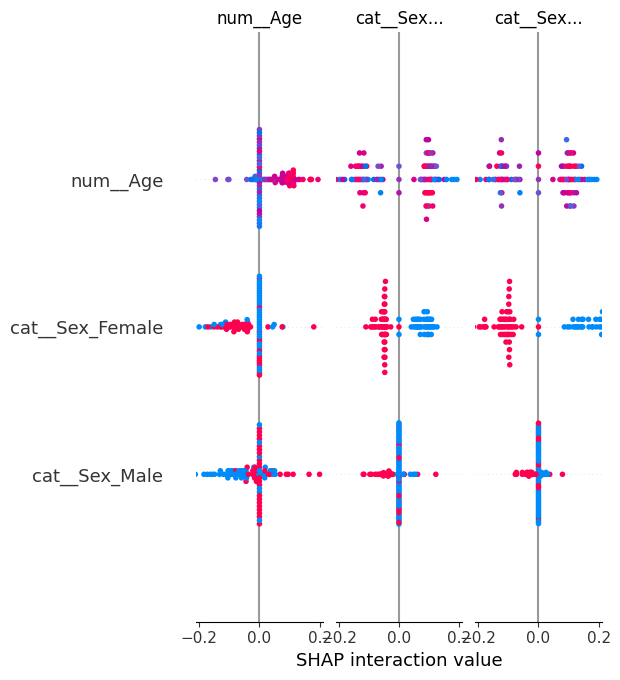

In [ ]:
# Use KernelExplainer for the CatBoost model (as TreeExplainer might have issues)
# Ensure X_train_res_dense and X_test_t_dense are available from previous cells
# If not, uncomment the lines below to convert sparse matrices to dense arrays
X_train_res_dense = X_train_res.toarray()
X_test_t_dense = X_test_t.toarray()

# Use the fitted CatBoost model from the tuning step
cat_model = best_cat

# Define a prediction function that returns probabilities for KernelExplainer
def predict_proba_cat(X):
    return cat_model.predict_proba(X)

# Use a small subset of the training data as the background dataset for KernelExplainer
background_data = shap.utils.sample(X_train_res_dense, 10) # Use 10 samples from training as background

# Initialize KernelExplainer
explainer_cat = shap.KernelExplainer(predict_proba_cat, background_data)

# Calculate SHAP values for a subset of the test data (e.g., first 100 samples)
# shap_values will be a list of arrays, one for each class
shap_values_cat = explainer_cat.shap_values(X_test_t_dense[:100])

# Get feature names from the preprocessor
feature_names = preprocessor.get_feature_names_out()

# For multiclass, shap_values_cat is a list. Decide which class to plot or summarize.
# Assuming you want to see contributions for a specific class, e.g., class 0
# Adjust the index [0] based on which class's impact you want to visualize
# You can also use shap.summary_plot(shap_values_cat) for a combined plot if it works for your data/SHAP version
class_to_plot = 0 # Example: plot for class with index 0
if isinstance(shap_values_cat, list):
    if class_to_plot < len(shap_values_cat):
        shap_values_to_plot = shap_values_cat[class_to_plot]
    else:
        print(f"Warning: Class index {class_to_plot} is out of bounds. Plotting for class 0 instead.")
        shap_values_to_plot = shap_values_cat[0]
else:
    # If shap_values_cat is a single array (binary), use it directly
    shap_values_to_plot = shap_values_cat

# Plot the summary plot
# Use the selected shap_values_to_plot for the chosen class
shap.summary_plot(shap_values_to_plot, X_test_t_dense[:100], feature_names=feature_names, plot_type='dot')

Logistic Regression

Logistic Regression model fitted.


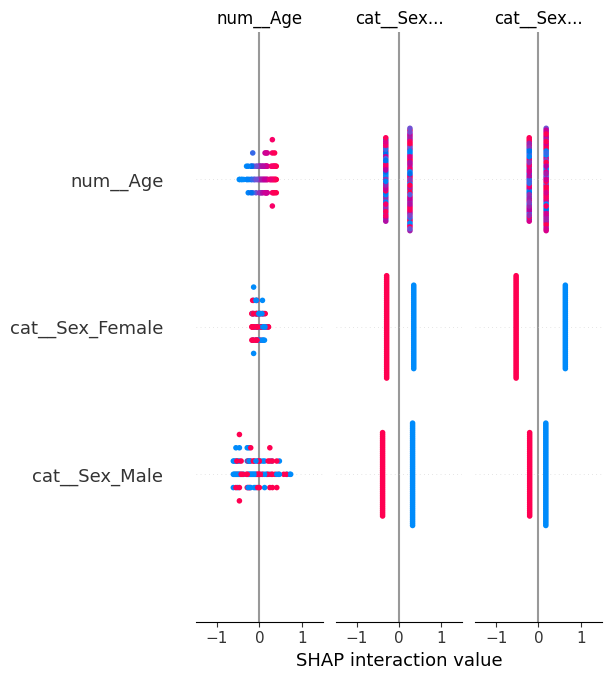

In [ ]:
import shap
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression # Import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE


# Redefine models dictionary to ensure LogisticRegression model is available
# This should match the definition in cell DAXnBBf02bHF
# Note: This redefines the *initialized* models. For SHAP, we need the *fitted* model.
# Assuming the models were fitted in cell DAXnBBf02bHF and are available in the environment.
# If not, the fitting step would need to be included here or in a preceding cell.
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)
# ANN model is defined in DAXnBBf02bHF and is not included here as LinearExplainer won't work for it.


# Ensure X_train_res and X_test_t are available from previous steps
# If not, you might need to include the data loading, preprocessing, and SMOTE steps as well for full self-containment

# Use LinearExplainer for the Logistic Regression model
# Convert sparse matrices to dense arrays for SHAP compatibility if needed
try:
    X_train_res_dense = X_train_res.toarray()
    X_test_t_dense = X_test_t.toarray()
except NameError:
    print("Error: X_train_res or X_test_t not defined or are not sparse matrices.")
    # Provide a fallback or raise error as needed
    X_train_res_dense = None
    X_test_t_dense = None


# Use the fitted Logistic Regression model from the 'models' dictionary
# Check if the model is fitted (LinearExplainer needs a fitted model)
lr_model = models.get('LogisticRegression', None)

if lr_model is None:
     print("Error: LogisticRegression model not found in 'models' dictionary.")
elif X_train_res_dense is None or X_test_t_dense is None:
     print("Error: Dense data arrays not available for SHAP.")
else:
    # Re-fit the Logistic Regression model on the resampled training data (X_train_res, y_train_res)
    # to ensure the model in 'models' is fitted in this execution context if needed.
    # If cell DAXnBBf02bHF was run and its models are in memory, this re-fitting might be redundant but safe.
    try:
        lr_model.fit(X_train_res, y_train_res)
        print("Logistic Regression model fitted.")
    except NameError:
        print("Error: X_train_res or y_train_res not defined. Please run the data loading, preprocessing, and SMOTE cells first.")
    except Exception as e:
        print(f"An error occurred during Logistic Regression fitting: {e}")


    explainer = shap.LinearExplainer(lr_model, X_train_res_dense)
    shap_values = explainer.shap_values(X_test_t_dense)

    # Get feature names from the preprocessor
    # Ensure preprocessor is available from previous cells
    try:
        feature_names = preprocessor.get_feature_names_out()
    except NameError:
        print("Error: preprocessor not defined. Please run the data loading and preprocessing cells first.")
        # Fallback or placeholder if preprocessor isn't available
        feature_names = [f"feature_{i}" for i in range(X_test_t_dense.shape[1])]


    # For multiclass, shap_values is a list. Decide which class to plot or summarize.
    # Assuming you want to see contributions for a specific class, e.g., class 0
    # Adjust the index [0] based on which class's impact you want to visualize
    # You can also use shap.summary_plot(shap_values) for a combined plot if it works for your data/SHAP version
    class_to_plot = 0 # Example: plot for class with index 0
    if isinstance(shap_values, list):
        if class_to_plot < len(shap_values):
            shap_values_to_plot = shap_values[class_to_plot]
        else:
            print(f"Warning: Class index {class_to_plot} is out of bounds. Plotting for class 0 instead.")
            shap_values_to_plot = shap_values[0]
    else:
        # If shap_values is a single array (binary), use it directly
        shap_values_to_plot = shap_values

    # Plot the summary plot
    # Use the selected shap_values_to_plot for the chosen class
    shap.summary_plot(shap_values_to_plot, X_test_t_dense, feature_names=feature_names, plot_type='dot')

Lime

In [ ]:

!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 17.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=55e26ffcf0642a98088964a166899ca7d2277eeb53b919f974f1b43e09603c92
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:

import lime
import lime.lime_tabular


In [ ]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_res.toarray(),  # Use resampled training data, convert to dense array
    feature_names=preprocessor.get_feature_names_out(), # Get feature names from preprocessor output
    class_names=classes,  # Use the actual target class names
    mode="classification"
)

ANN MODEL

In [ ]:
# Ensure X_test_t and ann are available from previous steps
# Convert X_test_t to a dense array for LIME compatibility if needed
X_test_t_dense = X_test_t.toarray()

# Select an instance from the test set to explain (e.g., the first instance)
instance_idx = 0
instance_to_explain = X_test_t_dense[instance_idx]

# Reshape the instance to be a 2D array (1 sample, n_features)
instance_to_explain = instance_to_explain.reshape(1, -1)

# Ensure the ANN model is available and fitted (assuming it was fitted in DAXnBBf02bHF)
# If not, you might need to include the model definition and fitting steps here
# Assuming 'ann' variable is available from DAXnBBf02bHF

# Define the prediction function for the ANN model, wrapping the output
# to return probabilities in a format LIME expects (e.g., for binary or OvR)
def predict_proba_ann(X):
    # Get the raw probabilities from the ANN model
    probs = ann.predict(X)
    # If the model outputs a single probability per instance (like sigmoid),
    # wrap it to return probabilities for both classes [1-prob, prob] for LIME
    # This assumes a binary or one-vs-rest interpretation where the single output is the probability of the positive class.
    # If the model were truly multiclass with softmax output, predict() would already return probabilities for all classes.
    if probs.ndim == 1 or probs.shape[1] == 1:
        # Ensure probabilities are in [0, 1] and reshape if necessary
        probs = np.clip(probs, 0, 1).reshape(-1, 1)
        # Return probabilities for class 0 (1-prob) and class 1 (prob)
        return np.hstack([1 - probs, probs])
    else:
        # If the model already returns probabilities for multiple classes, return as is
        return probs


# Generate LIME explanation for the selected instance using the ANN model
exp_model = lime_explainer.explain_instance(
    data_row=instance_to_explain[0], # Pass the 1D array for the instance
    predict_fn=predict_proba_ann,
    num_features=10,
    top_labels=len(classes) # Explain for all classes
)

# Show the explanation in the notebook
exp_model.show_in_notebook(show_table=True)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


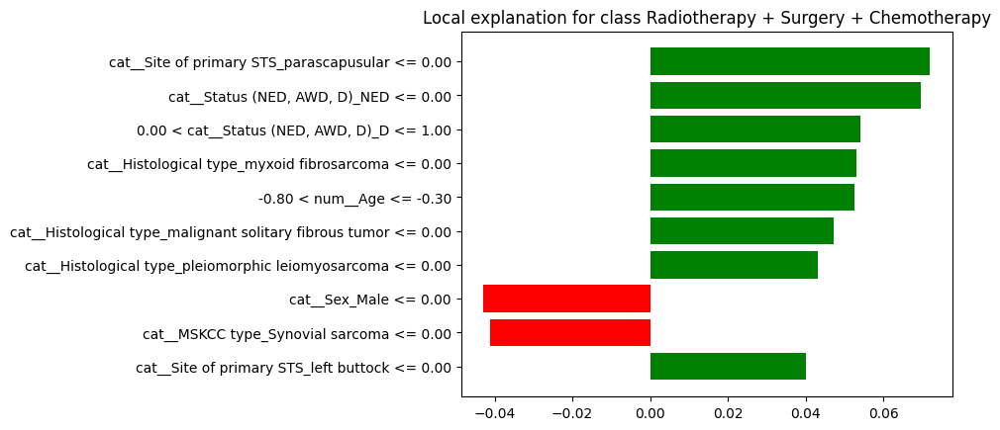

In [ ]:


%matplotlib inline
fig = exp_model.as_pyplot_figure()

XGBoost MODEL

In [ ]:
# Ensure X_test_t and best_xgb are available from previous steps
# Convert X_test_t to a dense array for LIME compatibility
X_test_t_dense = X_test_t.toarray()

# Select an instance from the test set to explain (e.g., the first instance)
instance_idx = 0
instance_to_explain = X_test_t_dense[instance_idx]

# Ensure the best_xgb model is available and fitted (assuming it was fitted in DAXnBBf02bHF or iiFhiOeGzwCU)
# Assuming 'best_xgb' variable is available

# Define the prediction function for the XGBoost model
def predict_proba_xgb(X):
    # Ensure input X is in the correct format (dense array)
    return best_xgb.predict_proba(X)

# Generate LIME explanation for the selected instance using the XGBoost model
exp_xgb = lime_explainer.explain_instance(
    data_row=instance_to_explain, # Pass the 1D array for the instance
    predict_fn=predict_proba_xgb,
    num_features=10,
    top_labels=len(classes) # Explain for all classes
)

# Show the explanation in the notebook
exp_xgb.show_in_notebook(show_table=True)

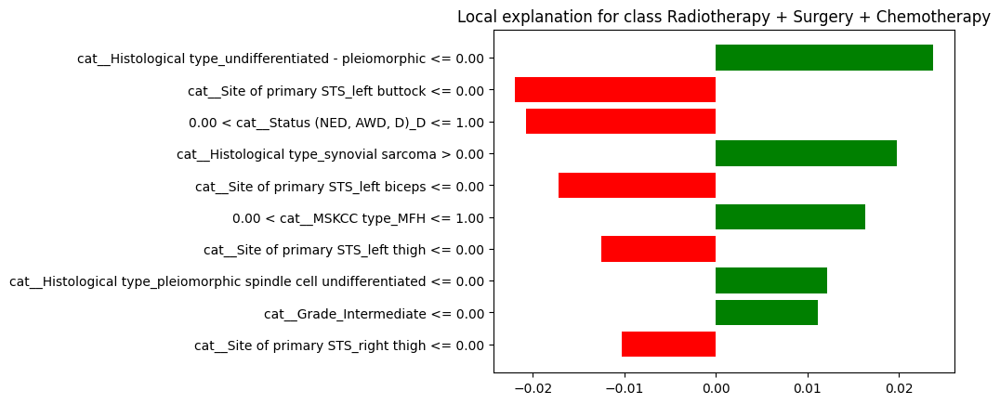

In [ ]:

%matplotlib inline
fig = exp_xgb.as_pyplot_figure()

DECISION TREE

In [ ]:
import shap # Although not used in this specific LIME cell, importing here for context
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression # Import LogisticRegression (for models dict)
from sklearn.ensemble import RandomForestClassifier, VotingClassifier # Import for models dict
from xgboost import XGBClassifier # Import for models dict
from catboost import CatBoostClassifier # Import for models dict
from sklearn.impute import SimpleImputer # Import for models dict
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder # Import for models dict
from sklearn.compose import ColumnTransformer # Import for models dict
from sklearn.pipeline import Pipeline # Import for models dict
from imblearn.over_sampling import SMOTE # Import for models dict

# Redefine models dictionary to ensure DecisionTree model is available
# This should match the definition in cell DAXnBBf02bHF
# Note: This redefines the *initialized* models. For LIME, we need the *fitted* model.
# Assuming the models were fitted in cell DAXnBBf02bHF and are available in the environment.
# If not, the fitting step would need to be included here or in a preceding cell.
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)
# ANN model is defined in DAXnBBf02bHF and is not included here as LIME needs predict_proba.

# Ensure X_test_t and models['DecisionTree'] are available from previous steps
# Convert X_test_t to a dense array for LIME compatibility
try:
    X_test_t_dense = X_test_t.toarray()
except NameError:
    print("Error: X_test_t not defined or is not a sparse matrix.")
    # Provide a fallback or raise error as needed
    X_test_t_dense = None

# Select an instance from the test set to explain (e.g., the first instance)
instance_idx = 0
if X_test_t_dense is not None:
    instance_to_explain = X_test_t_dense[instance_idx]
else:
    # Handle case where X_test_t_dense could not be created
    instance_to_explain = None
    print("Cannot generate LIME explanation: X_test_t_dense is not available.")


# Ensure the Decision Tree model is available and fitted
dt_model = models.get('DecisionTree', None)

if dt_model is None:
    print("Error: DecisionTree model not found in 'models' dictionary.")
elif instance_to_explain is None:
     pass # Error message already printed
else:
    # Re-fit the Decision Tree model if necessary (e.g., if running cell independently)
    # Assuming X_train_res and y_train_res are available from previous steps
    try:
        dt_model.fit(X_train_res, y_train_res)
        print("Decision Tree model fitted.")
    except NameError:
        print("Error: X_train_res or y_train_res not defined. Please run the data loading, preprocessing, and SMOTE cells first.")
    except Exception as e:
         print(f"An error occurred during Decision Tree fitting: {e}")

    # Define the prediction function that returns probabilities for LIME
    def predict_proba_dt(X):
        # Ensure input X is in the correct format (dense array if needed)
        return dt_model.predict_proba(X)

    # Generate LIME explanation for the selected instance using the Decision Tree model
    # Ensure lime_explainer is available from previous steps
    try:
        exp_dt = lime_explainer.explain_instance(
            data_row=instance_to_explain, # Pass the 1D array for the instance
            predict_fn=predict_proba_dt,
            num_features=10,
            top_labels=len(classes) # Explain for all classes
        )

        # Show the explanation in the notebook
        exp_dt.show_in_notebook(show_table=True)

    except NameError:
        print("Error: lime_explainer not defined. Please run the cell that initializes LimeTabularExplainer first.")
    except Exception as e:
        print(f"An error occurred during LIME explanation generation: {e}")

Decision Tree model fitted.


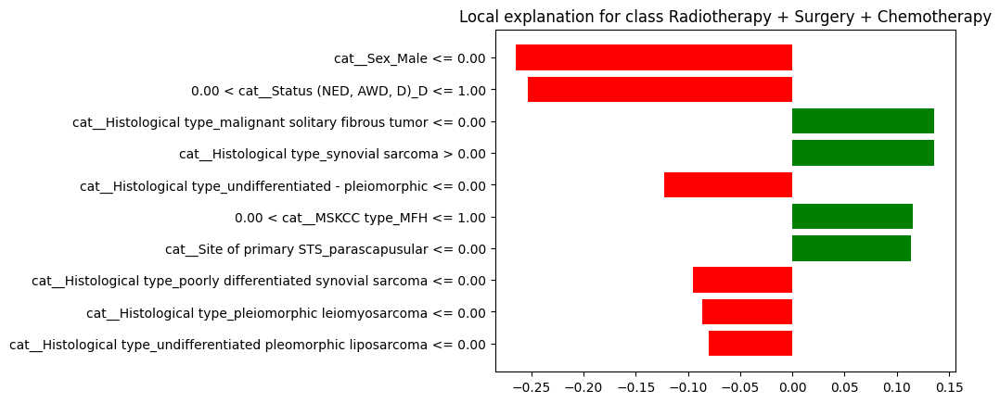

In [ ]:
fig_dt = exp_dt.as_pyplot_figure()


Random Forest

In [ ]:
import shap # Although not used in this specific LIME cell, importing here for context
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression # Import LogisticRegression (for models dict)
from sklearn.ensemble import RandomForestClassifier, VotingClassifier # Import for models dict
from xgboost import XGBClassifier # Import for models dict
from catboost import CatBoostClassifier # Import for models dict
from sklearn.impute import SimpleImputer # Import for models dict
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder # Import for models dict
from sklearn.compose import ColumnTransformer # Import for models dict
from sklearn.pipeline import Pipeline # Import for models dict
from imblearn.over_sampling import SMOTE # Import for models dict

# Redefine models dictionary to ensure RandomForest model is available
# This should match the definition in cell DAXnBBf02bHF
# Note: This redefines the *initialized* models. For LIME, we need the *fitted* model.
# Assuming the models were fitted in cell DAXnBBf02bHF and are available in the environment.
# If not, the fitting step would need to be included here or in a preceding cell.
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)

# Ensure X_test_t and models['RandomForest'] are available from previous steps
# Convert X_test_t to a dense array for LIME compatibility
try:
    X_test_t_dense = X_test_t.toarray()
except NameError:
    print("Error: X_test_t not defined or is not a sparse matrix.")
    # Provide a fallback or raise error as needed
    X_test_t_dense = None

# Select an instance from the test set to explain (e.g., the first instance)
instance_idx = 0
if X_test_t_dense is not None:
    instance_to_explain = X_test_t_dense[instance_idx]
else:
    # Handle case where X_test_t_dense could not be created
    instance_to_explain = None
    print("Cannot generate LIME explanation: X_test_t_dense is not available.")


# Ensure the RandomForest model is available and fitted
rf_model = models.get('RandomForest', None)

if rf_model is None:
    print("Error: RandomForest model not found in 'models' dictionary.")
elif instance_to_explain is None:
     pass # Error message already printed
else:
    # Re-fit the RandomForest model if necessary (e.g., if running cell independently)
    # Assuming X_train_res and y_train_res are available from previous steps
    try:
        rf_model.fit(X_train_res, y_train_res)
        print("RandomForest model fitted.")
    except NameError:
        print("Error: X_train_res or y_train_res not defined. Please run the data loading, preprocessing, and SMOTE cells first.")
    except Exception as e:
         print(f"An error occurred during RandomForest fitting: {e}")


    # Define the prediction function that returns probabilities for LIME
    def predict_proba_rf(X):
        # Ensure input X is in the correct format (dense array if needed)
        return rf_model.predict_proba(X)

    # Generate LIME explanation for the selected instance using the RandomForest model
    # Ensure lime_explainer and classes are available from previous steps
    try:
        exp_rf = lime_explainer.explain_instance(
            data_row=instance_to_explain, # Pass the 1D array for the instance
            predict_fn=predict_proba_rf,
            num_features=10,
            top_labels=len(classes) # Explain for all classes
        )

        # Show the explanation in the notebook
        exp_rf.show_in_notebook(show_table=True)

    except NameError:
        print("Error: lime_explainer or classes not defined. Please run the cells that initialize LimeTabularExplainer and define classes first.")
    except Exception as e:
        print(f"An error occurred during LIME explanation generation: {e}")

RandomForest model fitted.


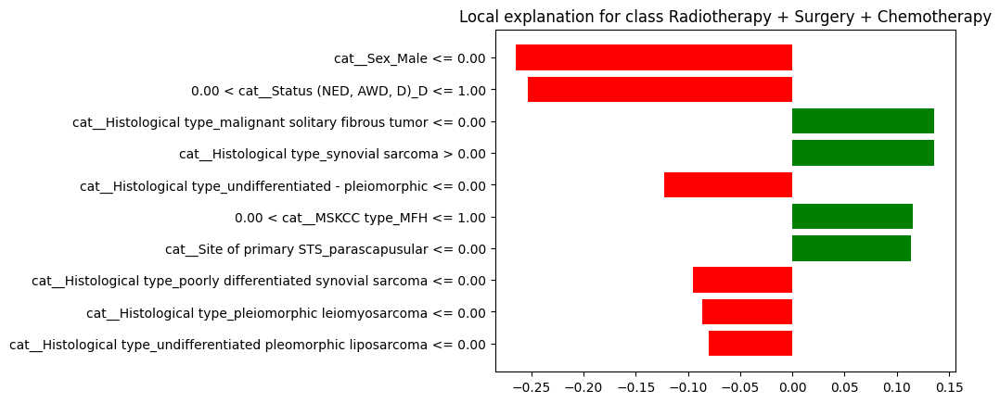

In [ ]:

fig_rf = exp_dt.as_pyplot_figure()

CAT BOOST

In [ ]:
# Ensure X_test_t, best_cat, lime_explainer, and classes are available from previous steps
# Convert X_test_t to a dense array for LIME compatibility
try:
    X_test_t_dense = X_test_t.toarray()
except NameError:
    print("Error: X_test_t not defined or is not a sparse matrix.")
    # Provide a fallback or raise error as needed
    X_test_t_dense = None

# Select an instance from the test set to explain (e.g., the first instance)
instance_idx = 0
if X_test_t_dense is not None:
    instance_to_explain = X_test_t_dense[instance_idx]
else:
    # Handle case where X_test_t_dense could not be created
    instance_to_explain = None
    print("Cannot generate LIME explanation: X_test_t_dense is not available.")

# Ensure the best_cat model is available and fitted
cat_model = None
try:
    cat_model = best_cat # Assume best_cat is available from previous tuning cell
except NameError:
    print("Error: best_cat model not defined. Please run the CatBoost tuning cell first.")


if cat_model is None:
    pass # Error message already printed
elif instance_to_explain is None:
     pass # Error message already printed
else:
    # Define the prediction function that returns probabilities for LIME
    def predict_proba_cat(X):
        # Ensure input X is in the correct format (dense array if needed)
        return cat_model.predict_proba(X)

    # Generate LIME explanation for the selected instance using the CatBoost model
    # Ensure lime_explainer and classes are available from previous steps
    try:
        exp_cat = lime_explainer.explain_instance(
            data_row=instance_to_explain, # Pass the 1D array for the instance
            predict_fn=predict_proba_cat,
            num_features=10,
            top_labels=len(classes) # Explain for all classes
        )

        # Show the explanation in the notebook
        exp_cat.show_in_notebook(show_table=True)

    except NameError:
        print("Error: lime_explainer or classes not defined. Please run the cells that initialize LimeTabularExplainer and define classes first.")
    except Exception as e:
        print(f"An error occurred during LIME explanation generation: {e}")

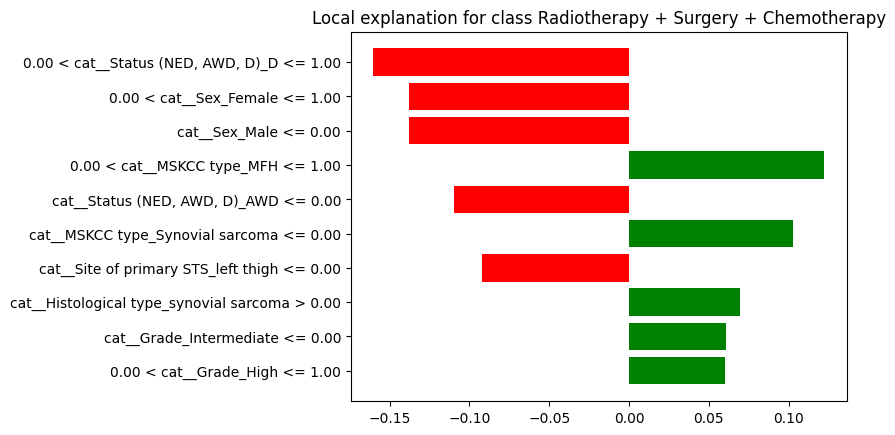

In [ ]:

fig_cat = exp_cat.as_pyplot_figure()

LOGISTIC REGRESSION

In [ ]:
import shap # Although not used in this specific LIME cell, importing here for context
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression # Import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE


# Redefine models dictionary to ensure LogisticRegression model is available
# This should match the definition in cell DAXnBBf02bHF
# Note: This redefines the *initialized* models. For LIME, we need the *fitted* model.
# Assuming the models were fitted in cell DAXnBBf02bHF and are available in the environment.
# If not, the fitting step would need to be included here or in a preceding cell.
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)
# ANN model is defined in DAXnBBf02bHF and is not included here as LinearExplainer won't work for it.


# Ensure X_train_res and X_test_t are available from previous steps
# If not, you might need to include the data loading, preprocessing, and SMOTE steps as well for full self-containment

# Use LinearExplainer for the Logistic Regression model
# Convert sparse matrices to dense arrays for SHAP compatibility if needed
try:
    X_train_res_dense = X_train_res.toarray()
    X_test_t_dense = X_test_t.toarray()
except NameError:
    print("Error: X_train_res or X_test_t not defined or are not sparse matrices.")
    # Provide a fallback or raise error as needed
    X_train_res_dense = None
    X_test_t_dense = None


# Use the fitted Logistic Regression model from the 'models' dictionary
# Check if the model is fitted (LinearExplainer needs a fitted model)
lr_model = models.get('LogisticRegression', None)

if lr_model is None:
     print("Error: LogisticRegression model not found in 'models' dictionary.")
elif X_train_res_dense is None or X_test_t_dense is None:
     print("Error: Dense data arrays not available for SHAP.")
else:
    # Re-fit the Logistic Regression model if necessary (e.g., if running cell independently)
    # Assuming X_train_res and y_train_res are available from previous steps
    try:
        lr_model.fit(X_train_res, y_train_res)
        print("Logistic Regression model fitted.")
    except NameError:
        print("Error: X_train_res or y_train_res not defined. Please run the data loading, preprocessing, and SMOTE cells first.")
    except Exception as e:
        print(f"An error occurred during Logistic Regression fitting: {e}")


    # Define the prediction function that returns probabilities for LIME
    def predict_proba_lr(X):
        # Ensure input X is in the correct format (dense array if needed)
        return lr_model.predict_proba(X)

    # Generate LIME explanation for the selected instance using the Logistic Regression model
    # Ensure lime_explainer and classes are available from previous steps
    try:
        exp_lr = lime_explainer.explain_instance(
            data_row=instance_to_explain, # Pass the 1D array for the instance
            predict_fn=predict_proba_lr, # Use the predict_proba function for LR
            num_features=10,
            top_labels=len(classes) # Explain for all classes
        )

        # Show the explanation in the notebook
        exp_lr.show_in_notebook(show_table=True)

    except NameError:
        print("Error: lime_explainer or classes not defined. Please run the cells that initialize LimeTabularExplainer and define classes first.")
    except Exception as e:
        print(f"An error occurred during LIME explanation generation: {e}")

Logistic Regression model fitted.


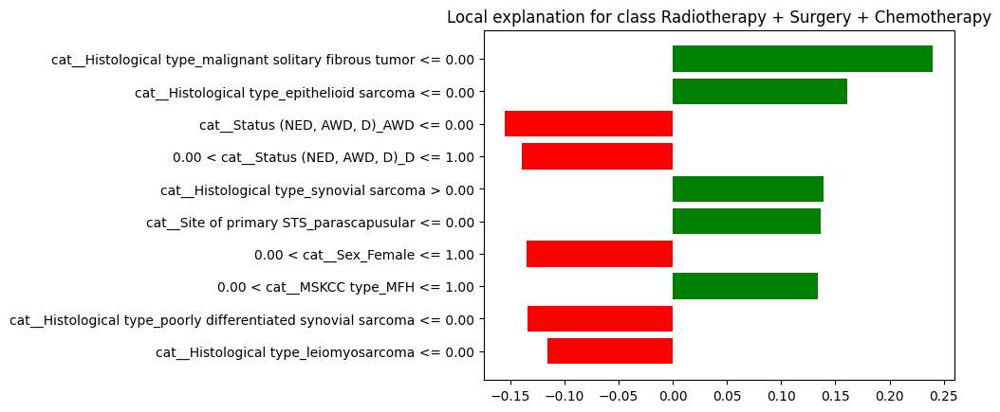

In [ ]:
fig_lr= exp_lr.as_pyplot_figure()

ICE

In [ ]:

!pip install ice


  Preparing metadata (setup.py) ... done
  Created wheel for ice: filename=ice-0.0.2-py3-none-any.whl size=11664 sha256=09b85bc8c47393b8e0bf12f16945b8b12ed0ffaa49a3d433183fdfda3d4c10ed
  Stored in directory: /root/.cache/pip/wheels/47/ab/d4/d73ad9aae95714c1c1a0778b6a469216f15d68d89f2e93605b
Successfully built ice


In [ ]:
feature_index = X_train_raw.columns.get_loc('Age')
feature_name = 'Age'

In [ ]:
# Use the min and max values from the training data

age_min, age_max = X_train_t[:, feature_index].min(), X_train_t[:, feature_index].max()
n_points = 100 # Number of points to evaluate along the feature range
age_values = np.linspace(age_min, age_max, n_points)

In [ ]:
# Select a subset of the data for ICE lines
n_ice_samples = 50 # Number of individual ICE lines to plot

# Get the number of samples in the test set
n_samples_test = X_test_t.shape[0]

# Select random indices from the available test samples
sample_indices = np.random.choice(n_samples_test, size=n_ice_samples, replace=False)

# Select the corresponding rows from the sparse matrix X_test_t using integer indices
X_ice_samples_sparse = X_test_t[sample_indices]

# Convert the selected sparse subset to a dense array
X_ice_samples = X_ice_samples_sparse.toarray()

ANN MODEL

In [ ]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []

# Get the index of the 'Age' feature in the transformed data
# Ensure feature_names is available from previous SHAP/LIME cells
try:
    feature_names = preprocessor.get_feature_names_out()
    # Find the index of the 'Age' feature in the transformed feature names
    # This assumes 'Age' is present and not one-hot encoded (it's numeric)
    # If 'Age' was part of a composite feature or transformed differently, this might need adjustment.
    age_feature_index_transformed = np.where(feature_names == 'num__Age')[0][0]
except NameError:
    print("Error: preprocessor or feature_names not defined. Cannot get index of 'Age' in transformed data.")
    # Handle error - maybe raise an exception or skip plotting

# Ensure ann, age_values, n_points, n_ice_samples, and X_ice_samples are available
# from previous cells before proceeding.

if 'age_feature_index_transformed' in locals() and ann is not None and age_values is not None and X_ice_samples is not None:
    for i in range(n_ice_samples):
        # Get the i-th instance from the selected test samples (NumPy array)
        instance_temp = X_ice_samples[i]

        # Create a temporary array by repeating the instance n_points times
        X_repeated = np.tile(instance_temp, (n_points, 1))

        # Vary the 'Age' feature at the correct index in the repeated array
        X_repeated[:, age_feature_index_transformed] = age_values

        # Convert to float32 if the ANN model expects it (common for Keras)
        X_repeated = X_repeated.astype('float32')

        # Get predictions from the ANN model
        # Use .predict as the ANN model defined in DAXnBBf02bHF has a sigmoid output
        # Assuming predict returns probabilities in the correct shape for the model's task
        predictions = ann.predict(X_repeated).ravel() # Get probabilities and flatten

        ice_predictions.append(predictions)
else:
    print("Cannot generate ICE predictions: Required variables (ann, age_values, X_ice_samples, or age_feature_index_transformed) are not available.")

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
4/4 ━━━━━━━━

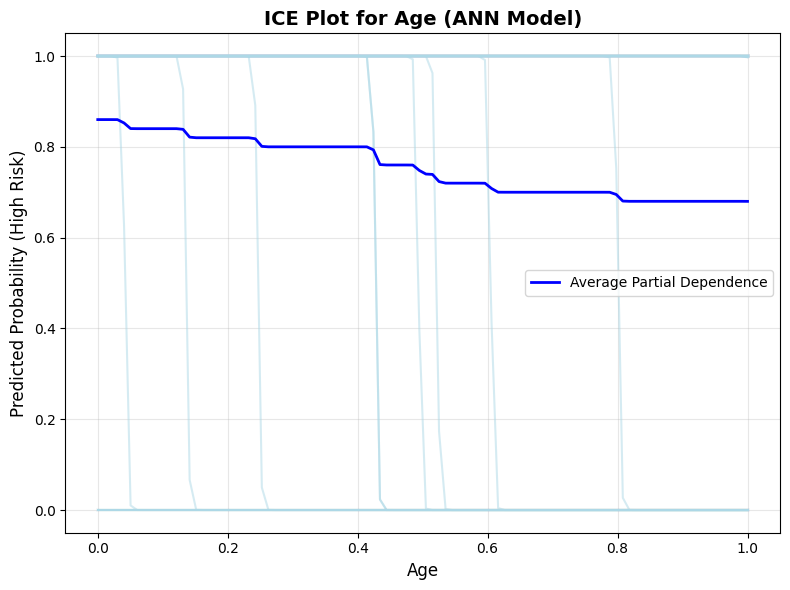

In [ ]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (ANN Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

XGBoost MODEL

In [ ]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []

# Get the index of the 'Age' feature in the transformed data
# Ensure preprocessor and feature_name are available from previous cells
try:
    feature_names = preprocessor.get_feature_names_out()
    # Find the index of the 'Age' feature in the transformed feature names
    # This assumes 'Age' is present and not one-hot encoded (it's numeric)
    age_feature_index_transformed = np.where(feature_names == 'num__Age')[0][0]
except NameError:
    print("Error: preprocessor or feature_name not defined. Cannot get index of 'Age' in transformed data.")
    # Handle error - maybe raise an exception or skip plotting

# Ensure best_xgb, age_values, n_points, n_ice_samples, and X_ice_samples are available
# from previous cells before proceeding.

if 'age_feature_index_transformed' in locals() and best_xgb is not None and age_values is not None and X_ice_samples is not None:
    for i in range(n_ice_samples):
        # Get the i-th instance from the selected test samples (NumPy array)
        instance_temp = X_ice_samples[i]

        # Create a temporary array by repeating the instance n_points times
        X_repeated = np.tile(instance_temp, (n_points, 1))

        # Vary the 'Age' feature at the correct index in the repeated array
        X_repeated[:, age_feature_index_transformed] = age_values

        # Get predictions from the XGBoost model (probabilities for each class)
        predictions_proba = best_xgb.predict_proba(X_repeated)

        # For ICE plots, we typically plot the probability of a specific class.
        # Let's plot the probability of the first class (index 0) as an example.
        # You can change the index to plot for a different class.
        predictions = predictions_proba[:, 0]

        ice_predictions.append(predictions)
else:
    print("Cannot generate ICE predictions: Required variables are not available.")

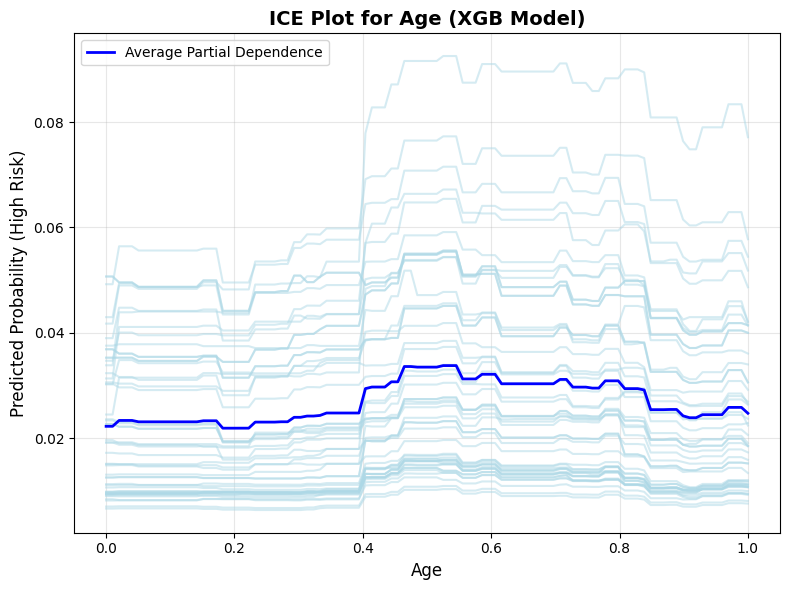

In [ ]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (XGB Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

DECISION TREE

In [ ]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []

# Redefine models dictionary to ensure DecisionTree model is available
# This should match the definition in cell DAXnBBf02bHF
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)

# Ensure Decision Tree model is fitted (re-fit if necessary for robustness)
dt_model = models['DecisionTree']
try:
    dt_model.fit(X_train_res, y_train_res) # Assuming X_train_res, y_train_res are available
    print("Decision Tree model fitted.")
except NameError:
    print("Warning: Could not re-fit Decision Tree model as X_train_res or y_train_res not found.")
    # Proceed assuming the model was fitted previously

# Get the index of the 'Age' feature in the transformed data
# Ensure preprocessor and feature_name are available from previous cells
try:
    feature_names = preprocessor.get_feature_names_out()
    # Find the index of the 'Age' feature in the transformed feature names
    age_feature_index_transformed = np.where(feature_names == 'num__Age')[0][0]
except NameError:
    print("Error: preprocessor or feature_name not defined. Cannot get index of 'Age' in transformed data.")
    age_feature_index_transformed = None # Handle error


# Ensure age_values, n_points, n_ice_samples, and X_ice_samples are available
if age_feature_index_transformed is not None and age_values is not None and X_ice_samples is not None:
    for i in range(n_ice_samples):
        # Get the i-th instance from the selected test samples (NumPy array)
        instance_temp = X_ice_samples[i]

        # Create a temporary array by repeating the instance n_points times
        X_repeated = np.tile(instance_temp, (n_points, 1))

        # Vary the 'Age' feature at the correct index in the repeated array
        X_repeated[:, age_feature_index_transformed] = age_values

        # Get predictions from the Decision Tree model (probabilities for each class)
        # Use predict_proba for ICE plots in classification
        predictions_proba = dt_model.predict_proba(X_repeated)

        # For ICE plots, we typically plot the probability of a specific class.
        # Let's plot the probability of the first class (index 0) as an example.
        # You can change the index to plot for a different class.
        predictions = predictions_proba[:, 0]

        ice_predictions.append(predictions)
else:
    print("Cannot generate ICE predictions: Required variables are not available or Age feature index not found.")

Decision Tree model fitted.


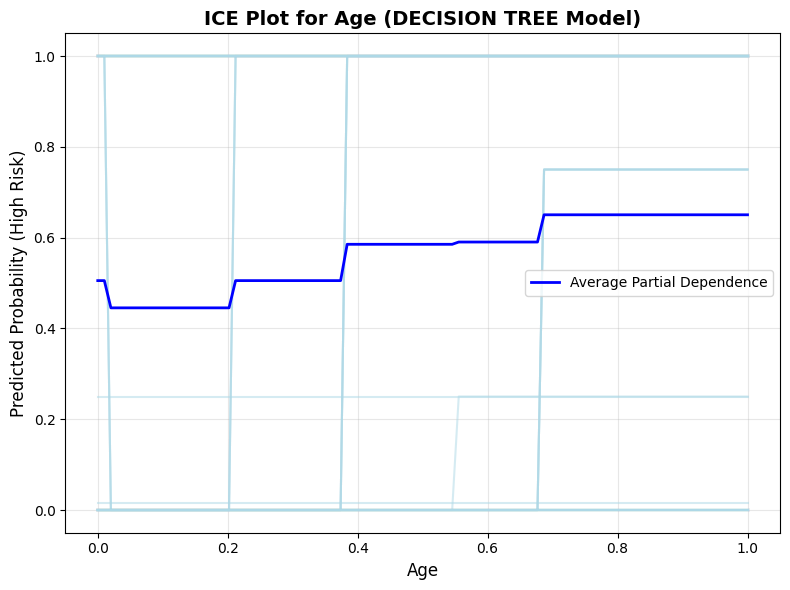

In [ ]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (DECISION TREE Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

RANDOM FOREST

In [ ]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []

# Redefine models dictionary to ensure RandomForest model is available
# This should match the definition in cell DAXnBBf02bHF
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)

# Ensure RandomForest model is fitted (re-fit if necessary for robustness)
rf_model = models['RandomForest']
try:
    rf_model.fit(X_train_res, y_train_res) # Assuming X_train_res, y_train_res are available
    print("RandomForest model fitted.")
except NameError:
    print("Warning: Could not re-fit RandomForest model as X_train_res or y_train_res not found.")
    # Proceed assuming the model was fitted previously


# Get the index of the 'Age' feature in the transformed data
# Ensure preprocessor and feature_name are available from previous cells
try:
    feature_names = preprocessor.get_feature_names_out()
    # Find the index of the 'Age' feature in the transformed feature names
    age_feature_index_transformed = np.where(feature_names == 'num__Age')[0][0]
except NameError:
    print("Error: preprocessor or feature_name not defined. Cannot get index of 'Age' in transformed data.")
    age_feature_index_transformed = None # Handle error


# Ensure age_values, n_points, n_ice_samples, and X_ice_samples are available
if age_feature_index_transformed is not None and age_values is not None and X_ice_samples is not None:
    for i in range(n_ice_samples):
        # Get the i-th instance from the selected test samples (NumPy array)
        instance_temp = X_ice_samples[i]

        # Create a temporary array by repeating the instance n_points times
        X_repeated = np.tile(instance_temp, (n_points, 1))

        # Vary the 'Age' feature at the correct index in the repeated array
        X_repeated[:, age_feature_index_transformed] = age_values

        # Get predictions from the RandomForest model (probabilities for each class)
        # Use predict_proba for ICE plots in classification
        predictions_proba = rf_model.predict_proba(X_repeated)

        # For ICE plots, we typically plot the probability of a specific class.
        # Let's plot the probability of the first class (index 0) as an example.
        # You can change the index to plot for a different class.
        predictions = predictions_proba[:, 0]

        ice_predictions.append(predictions)
else:
    print("Cannot generate ICE predictions: Required variables are not available or Age feature index not found.")

RandomForest model fitted.


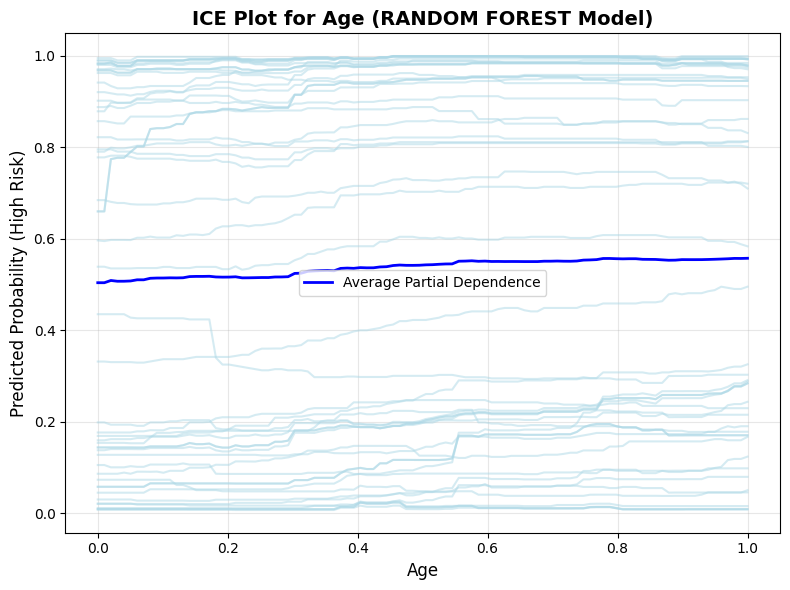

In [ ]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (RANDOM FOREST Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

CATBOOST

In [ ]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []

# Get the index of the 'Age' feature in the transformed data
# Ensure preprocessor and feature_name are available from previous cells
try:
    feature_names = preprocessor.get_feature_names_out()
    # Find the index of the 'Age' feature in the transformed feature names
    # This assumes 'Age' is present and not one-hot encoded (it's numeric)
    age_feature_index_transformed = np.where(feature_names == 'num__Age')[0][0]
except NameError:
    print("Error: preprocessor or feature_name not defined. Cannot get index of 'Age' in transformed data.")
    age_feature_index_transformed = None # Handle error


# Ensure best_cat, age_values, n_points, n_ice_samples, and X_ice_samples are available
if age_feature_index_transformed is not None and best_cat is not None and age_values is not None and X_ice_samples is not None:
    for i in range(n_ice_samples):
        # Get the i-th instance from the selected test samples (NumPy array)
        instance_temp = X_ice_samples[i]

        # Create a temporary array by repeating the instance n_points times
        X_repeated = np.tile(instance_temp, (n_points, 1))

        # Vary the 'Age' feature at the correct index in the repeated array
        X_repeated[:, age_feature_index_transformed] = age_values

        # Get predictions from the CatBoost model (probabilities for each class)
        # Use predict_proba for ICE plots in classification
        predictions_proba = best_cat.predict_proba(X_repeated)

        # For ICE plots, we typically plot the probability of a specific class.
        # Let's plot the probability of the first class (index 0) as an example.
        # You can change the index to plot for a different class.
        predictions = predictions_proba[:, 0]

        ice_predictions.append(predictions)
else:
    print("Cannot generate ICE predictions: Required variables are not available or Age feature index not found.")

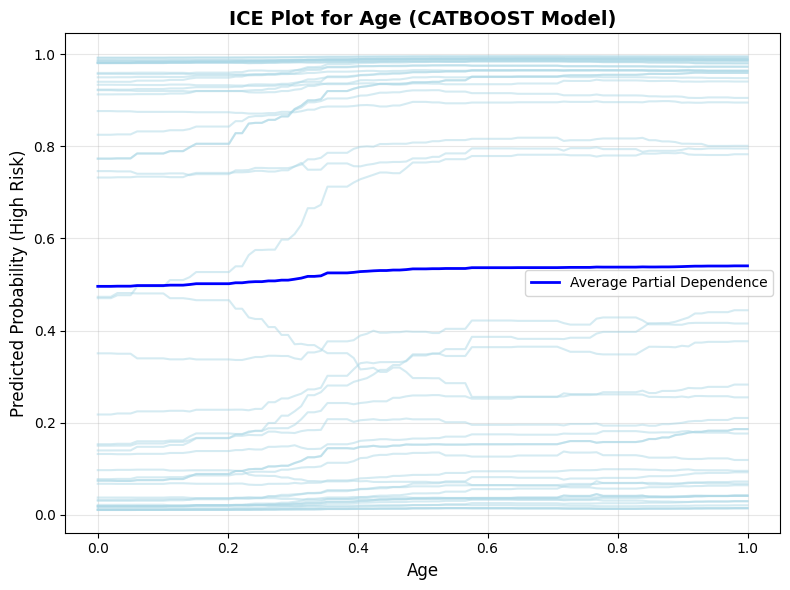

In [ ]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (CATBOOST Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

LOGISTIC REGRESSION

In [ ]:
#Calculate predictions for each ICE sample across the feature range
ice_predictions = []

# Redefine models dictionary to ensure LogisticRegression model is available
# This should match the definition in cell DAXnBBf02bHF
models = {}
models['LogisticRegression'] = LogisticRegression(max_iter=2000, random_state=42)
models['DecisionTree'] = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
models['RandomForest'] = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42, n_jobs=-1)
models['XGBoost'] = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=1)
models['CatBoost'] = CatBoostClassifier(verbose=0, random_seed=42)

# Ensure Logistic Regression model is fitted (re-fit if necessary for robustness)
lr_model = models['LogisticRegression']
try:
    lr_model.fit(X_train_res, y_train_res) # Assuming X_train_res, y_train_res are available
    print("Logistic Regression model fitted.")
except NameError:
    print("Warning: Could not re-fit Logistic Regression model as X_train_res or y_train_res not found.")
    # Proceed assuming the model was fitted previously

# Get the index of the 'Age' feature in the transformed data
# Ensure preprocessor and feature_name are available from previous cells
try:
    feature_names = preprocessor.get_feature_names_out()
    # Find the index of the 'Age' feature in the transformed feature names
    # This assumes 'Age' is present and not one-hot encoded (it's numeric)
    age_feature_index_transformed = np.where(feature_names == 'num__Age')[0][0]
except NameError:
    print("Error: preprocessor or feature_name not defined. Cannot get index of 'Age' in transformed data.")
    age_feature_index_transformed = None # Handle error


# Ensure age_values, n_points, n_ice_samples, and X_ice_samples are available
if age_feature_index_transformed is not None and age_values is not None and X_ice_samples is not None:
    for i in range(n_ice_samples):
        # Get the i-th instance from the selected test samples (NumPy array)
        instance_temp = X_ice_samples[i]

        # Create a temporary array by repeating the instance n_points times
        X_repeated = np.tile(instance_temp, (n_points, 1))

        # Vary the 'Age' feature at the correct index in the repeated array
        X_repeated[:, age_feature_index_transformed] = age_values

        # Get predictions from the Logistic Regression model (probabilities for each class)
        # Use predict_proba for ICE plots in classification
        predictions_proba = lr_model.predict_proba(X_repeated)

        # For ICE plots, we typically plot the probability of a specific class.
        # Let's plot the probability of the first class (index 0) as an example.
        # You can change the index to plot for a different class.
        predictions = predictions_proba[:, 0]

        ice_predictions.append(predictions)
else:
    print("Cannot generate ICE predictions: Required variables are not available or Age feature index not found.")

Logistic Regression model fitted.


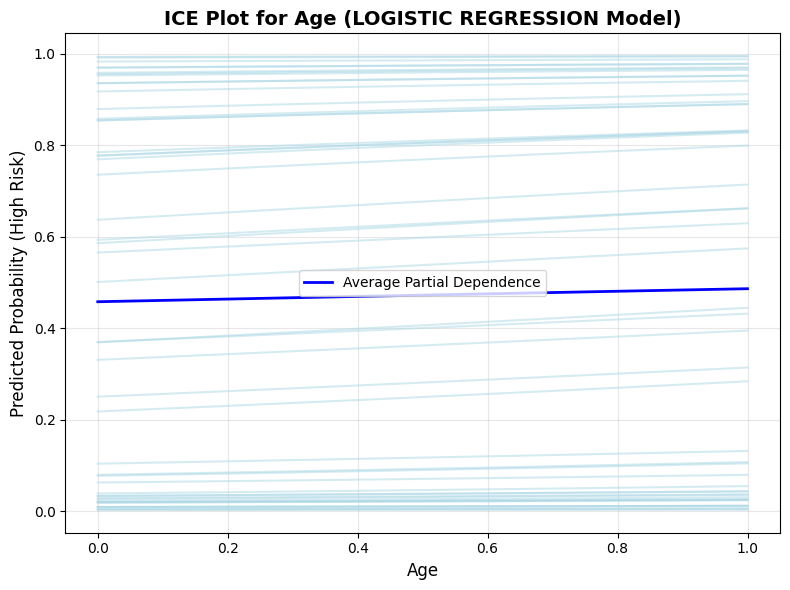

In [ ]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (LOGISTIC REGRESSION Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()
